In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [9]:
from pathlib import Path
import pandas as pd
from tqdm import tqdm
import json
import numpy as np
import pickle
import cv2

import matplotlib.pyplot as plt
import seaborn as sns
from openslide import OpenSlide

In [4]:
slide_list = {path.name: OpenSlide(str(path)) for path in tqdm(Path(r"D:\Datasets\ScannerStudy").glob("*/*/*.*")) 
                      if path.suffix in [".svs", ".ndpi", ".tif"]}

slide_list


0it [00:00, ?it/s]
1it [00:00,  4.59it/s]
2it [00:00,  3.99it/s]
3it [00:00,  4.05it/s]
4it [00:01,  3.26it/s]
5it [00:01,  3.24it/s]
6it [00:01,  3.50it/s]
7it [00:02,  3.65it/s]
8it [00:02,  3.82it/s]
9it [00:02,  3.95it/s]
10it [00:02,  4.03it/s]
14it [00:02,  5.44it/s]
18it [00:02,  7.25it/s]
21it [00:03,  9.09it/s]
23it [00:03,  9.64it/s]
25it [00:03, 10.35it/s]
27it [00:03, 11.95it/s]
30it [00:03, 13.87it/s]
35it [00:03, 17.45it/s]
38it [00:04, 15.72it/s]
41it [00:04, 15.69it/s]
76it [00:04, 17.33it/s]


{'A_CCMCT_183715A_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\CCMCT\\A_CCMCT_183715A_1.svs'),
 'A_CCMCT_22108_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\CCMCT\\A_CCMCT_22108_1.svs'),
 'A_CCMCT_29609B_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\CCMCT\\A_CCMCT_29609B_1.svs'),
 'A_CCMCT_380609B_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\CCMCT\\A_CCMCT_380609B_1.svs'),
 'A_CCMCT_518711B_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\CCMCT\\A_CCMCT_518711B_1.svs'),
 'A_BB_563476_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\Cyto\\A_BB_563476_1.svs'),
 'A_BB_563479_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\Cyto\\A_BB_563479_1.svs'),
 'A_BB_568320_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\Cyto\\A_BB_568320_1.svs'),
 'A_BB_568381_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\Cyto\\A_BB_568381_1.svs'),
 'A_BB_574162_1.svs': OpenSlide('D:\\Datasets\\ScannerStudy\\Aperio\\Cyto\\A_BB_574162_1.svs'),
 

In [5]:
coordinates = {
    "L0": (0, 0), 
    "L1": (1, 0), 
    "L2": (2, 0), 
    "L3": (3, 0),   
    "L4": (4, 0),
    
    "L5": (0, 1),
    "L6": (1, 1),
    "L7": (2, 1),
    "L8": (3, 1),    
    "L9": (4, 1),
    
    "L10": (0, 2),
    "L11": (1, 2),
    "L12": (2, 2),
    "L13": (3, 2),    
    "L14": (4, 2),
    
    "L15": (0, 3),
    "L16": (1, 3),
    "L17": (2, 3),
    "L18": (3, 3),    
    "L19": (4, 3),
    
    "L20": (0, 4),
    "L21": (1, 4),
    "L22": (2, 4),
    "L23": (3, 4),    
    "L24": (4, 4),
}

In [6]:
def add_help_fields(frame):
    
    frame["image_name_stem"] = [Path(image_name).stem for image_name in frame["image_name"]]
    
    frame["patient_id"] = [name.split("_")[2] for name in frame["image_name"]]

    frame["x1"] = [json.loads(vector.replace("\'","\""))['x1'] for vector in frame["vector"]]
    frame["y1"] = [json.loads(vector.replace("\'","\""))['y1'] for vector in frame["vector"]]

    frame["x2"] = [json.loads(vector.replace("\'","\""))['x2'] for vector in frame["vector"]]
    frame["y2"] = [json.loads(vector.replace("\'","\""))['y2'] for vector in frame["vector"]]

    frame["center_x"] = [x1 + ((x2-x1) / 2) for x1, x2 in zip(frame["x1"], frame["x2"])]
    frame["center_y"] = [y1 + ((y2-y1) / 2) for y1, y2 in zip(frame["y1"], frame["y2"])]
    
    frame["center"] = [np.array((center_x, center_y)) for center_x, center_y in zip(frame["center_x"], frame["center_y"])]

    frame["anno_width"] = [x2-x1 for x1, x2 in zip(frame["x1"], frame["x2"])]
    frame["anno_height"]= [y2-y1 for y1, y2 in zip(frame["y1"], frame["y2"])]
    
    return frame

In [68]:
gt_annotations = add_help_fields(pd.read_csv("GT.csv"))
gt_annotations.head()

,scanner,image_id,image_name,image_type,image_width,image_height,id,vector,unique_identifier,annotation_type,...,patient_id,x1,y1,x2,y2,center_x,center_y,center,anno_width,anno_height
0,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755406,"{'x1': 20354, 'x2': 20408, 'y1': 16752, 'y2': ...",95183f6e-0a00-4de4-9c97-fedfec655a27,384,...,380609B,20354,16752,20408,16806,20381.0,16779.0,"[20381.0, 16779.0]",54,54
1,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755407,"{'x1': 20256, 'x2': 20310, 'y1': 35448, 'y2': ...",cc3def2b-5631-4619-ab08-51f2a69c667d,385,...,380609B,20256,35448,20310,35502,20283.0,35475.0,"[20283.0, 35475.0]",54,54
2,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755408,"{'x1': 20445, 'x2': 20499, 'y1': 54139, 'y2': ...",2d3de917-e55a-470f-8af2-10eb49b69687,386,...,380609B,20445,54139,20499,54193,20472.0,54166.0,"[20472.0, 54166.0]",54,54
3,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755409,"{'x1': 26495, 'x2': 26549, 'y1': 71854, 'y2': ...",611f9d35-6cdb-42ef-bc38-2f44c9aaa257,387,...,380609B,26495,71854,26549,71908,26522.0,71881.0,"[26522.0, 71881.0]",54,54
4,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755410,"{'x1': 35443, 'x2': 35497, 'y1': 90091, 'y2': ...",bf3ef0d3-5153-4693-96ba-96047cb3ae24,388,...,380609B,35443,90091,35497,90145,35470.0,90118.0,"[35470.0, 90118.0]",54,54


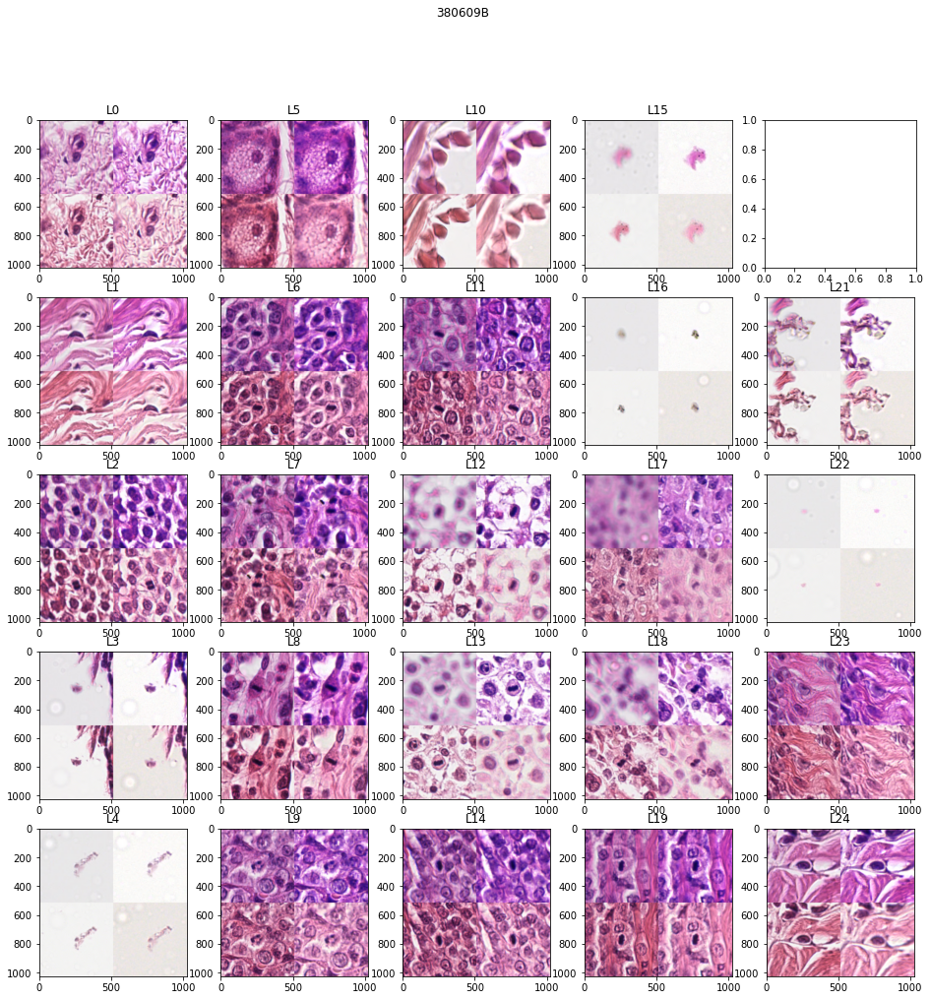

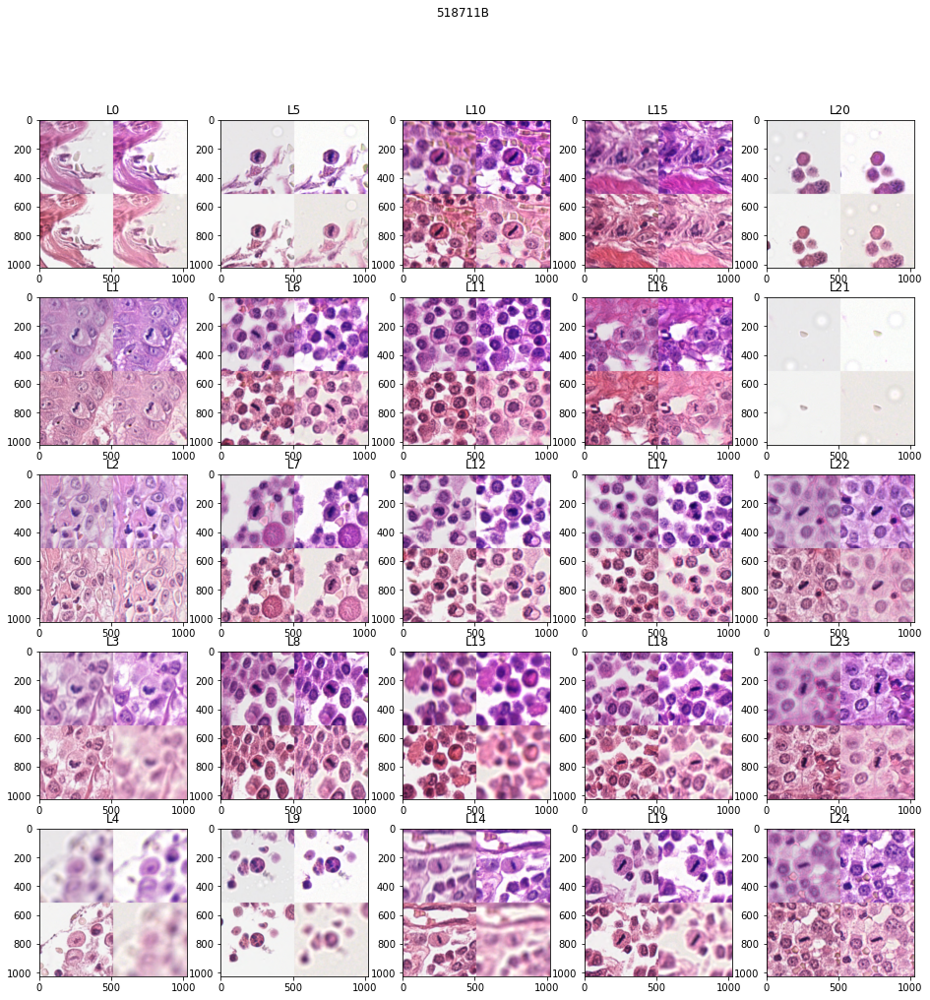

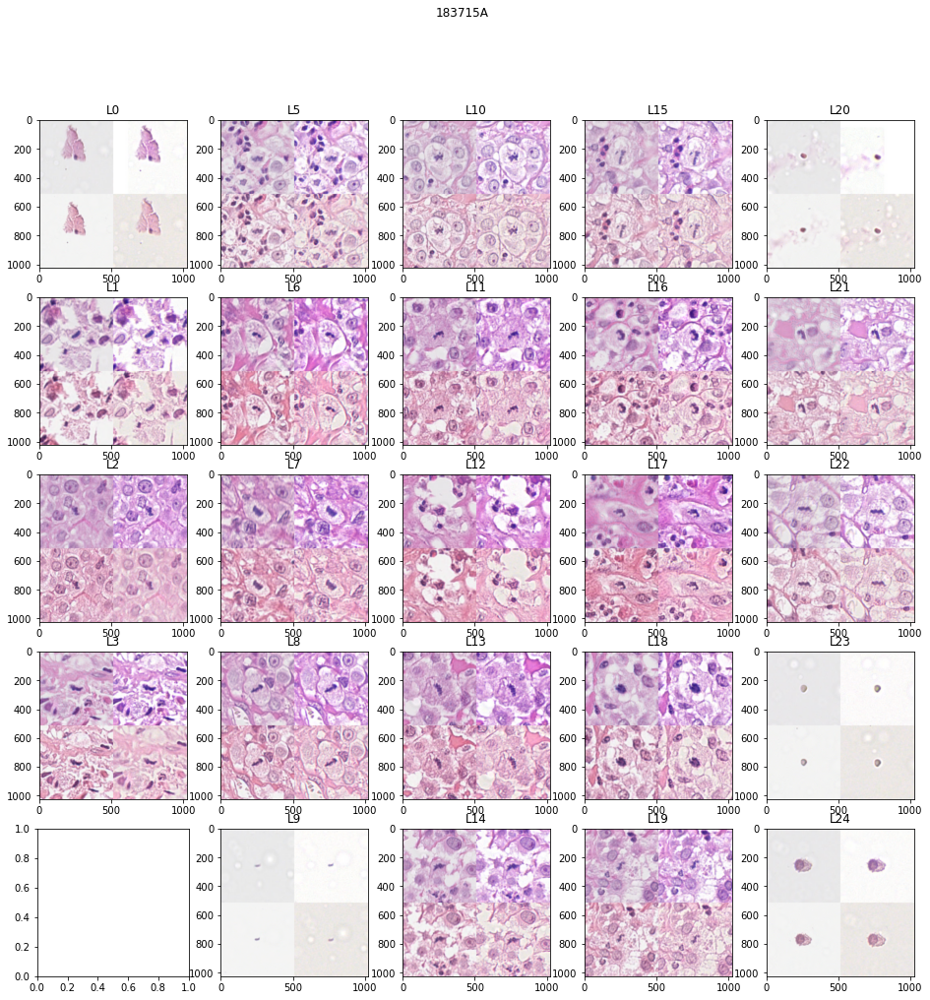

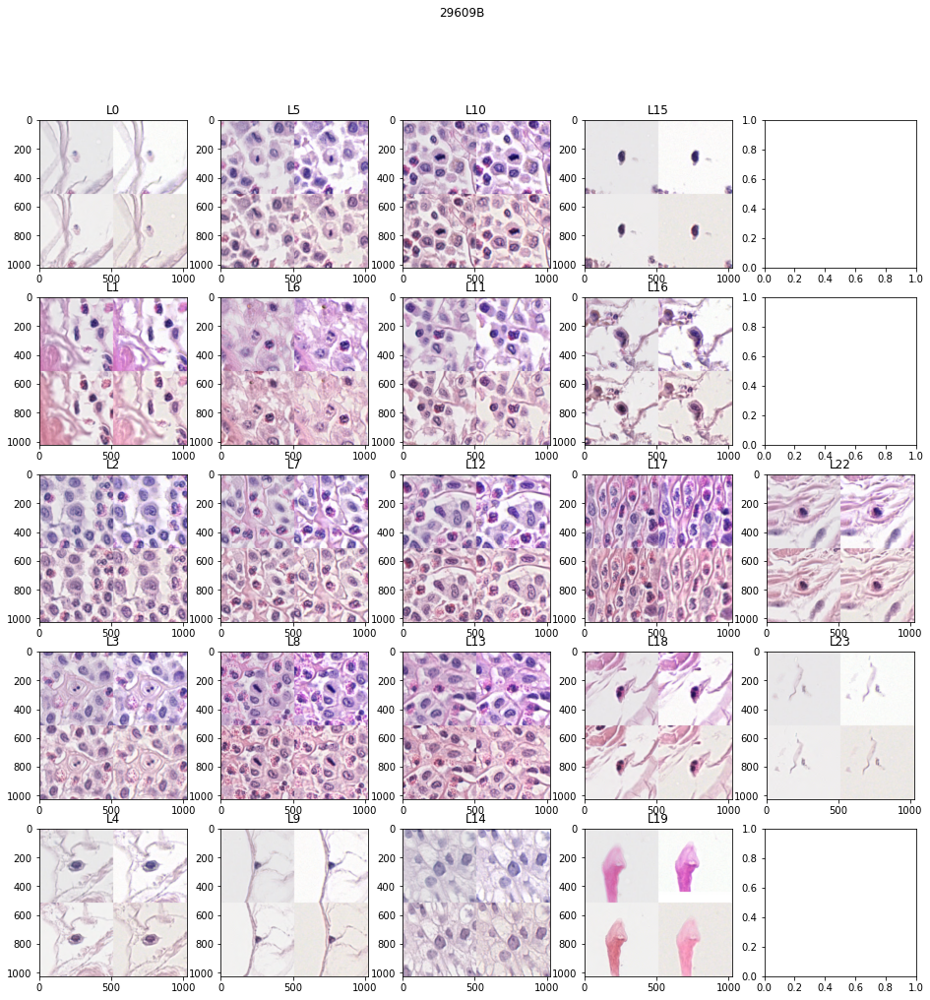

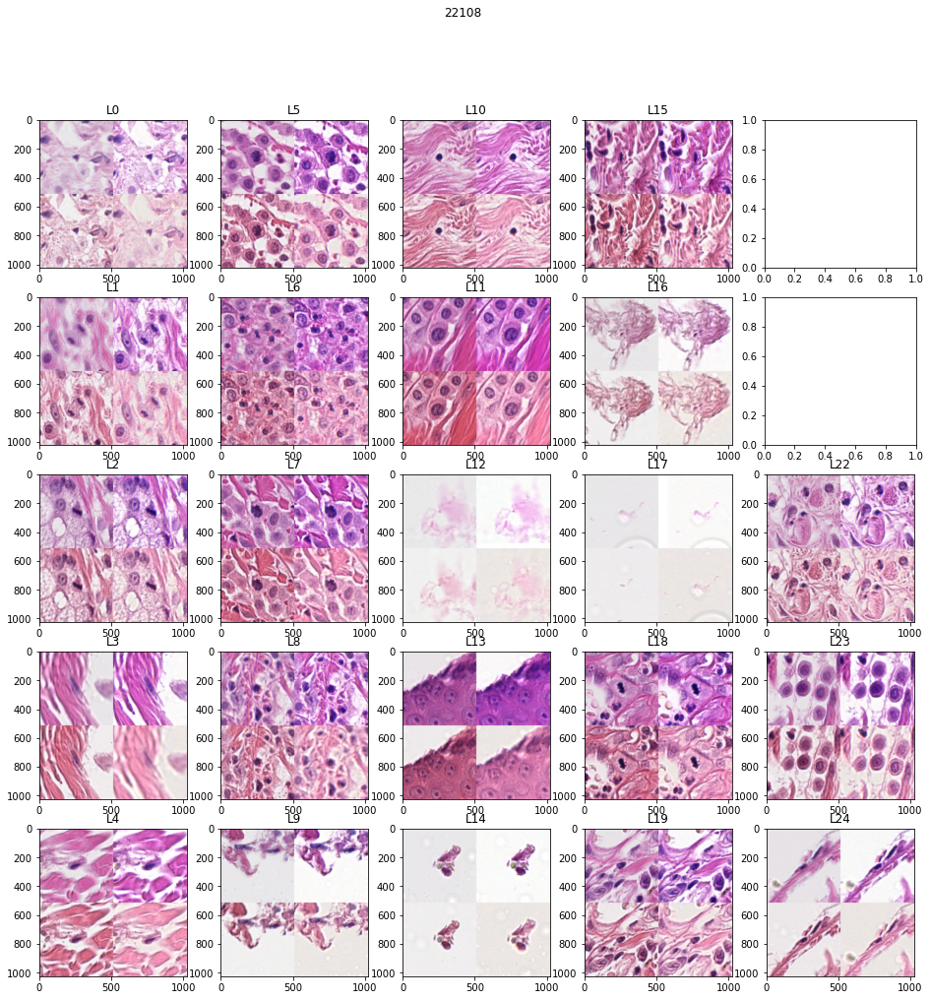

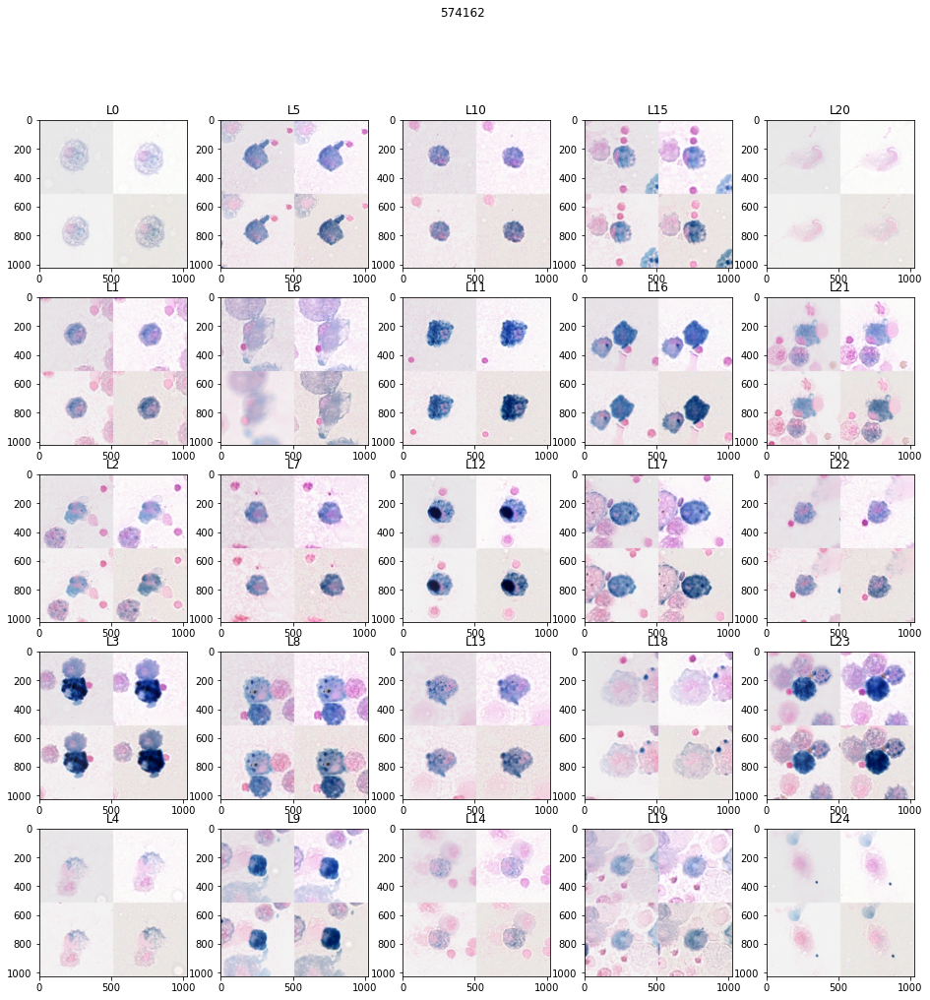

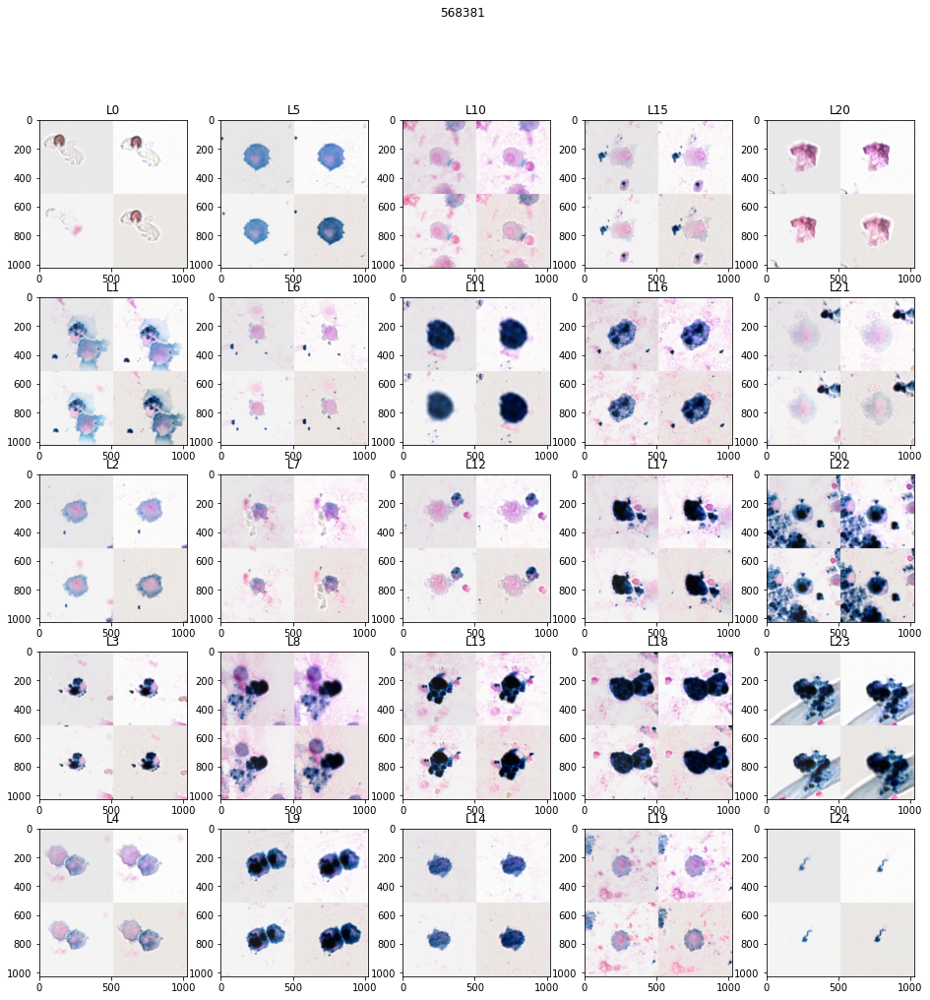

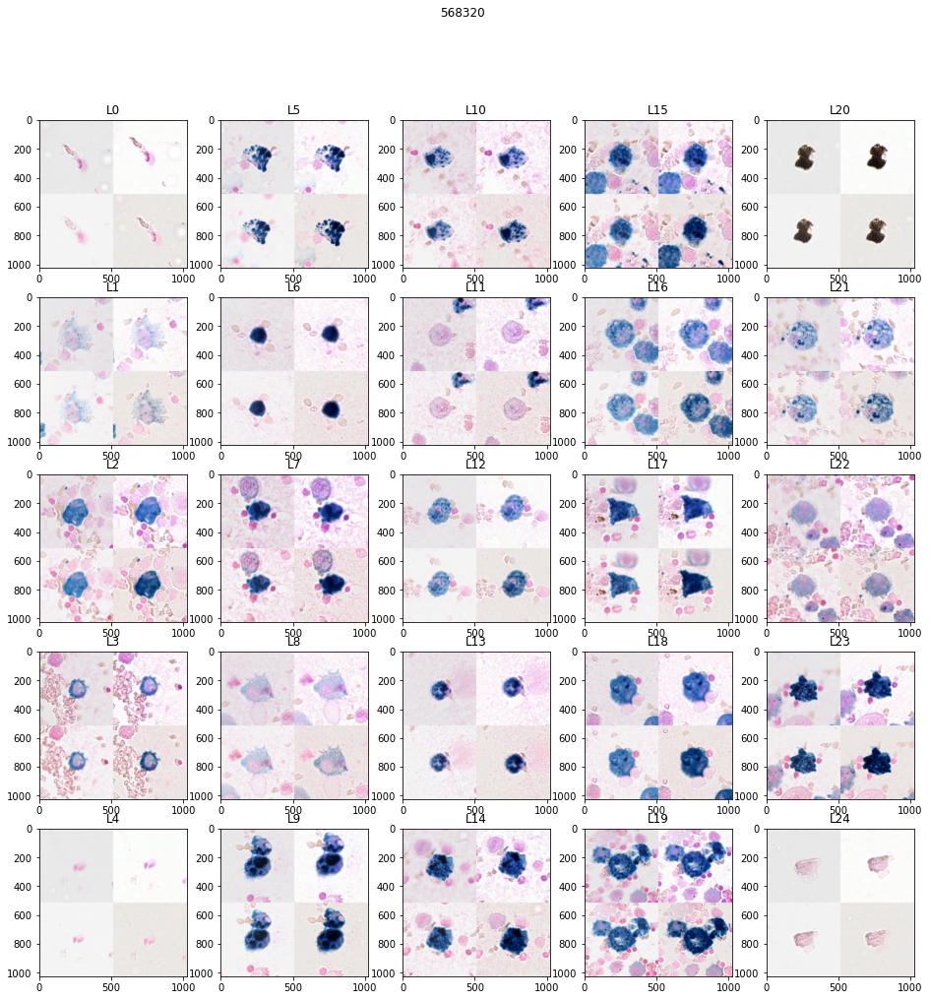

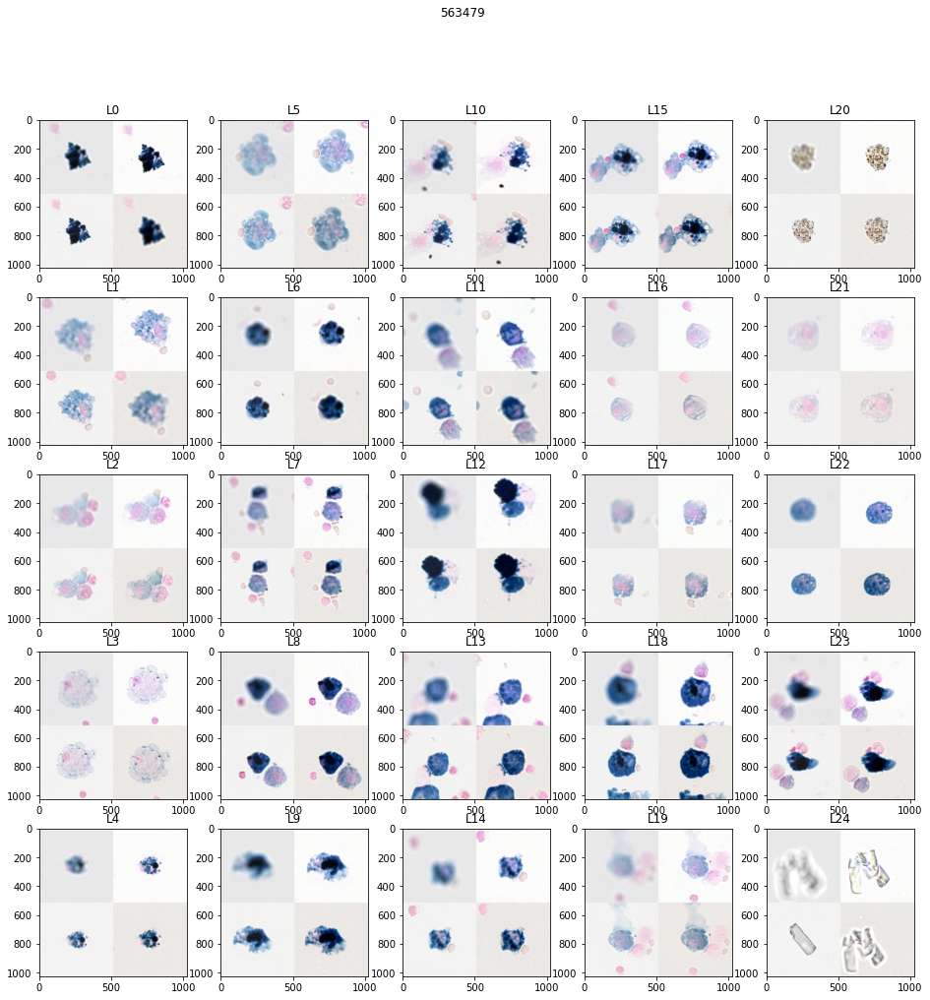

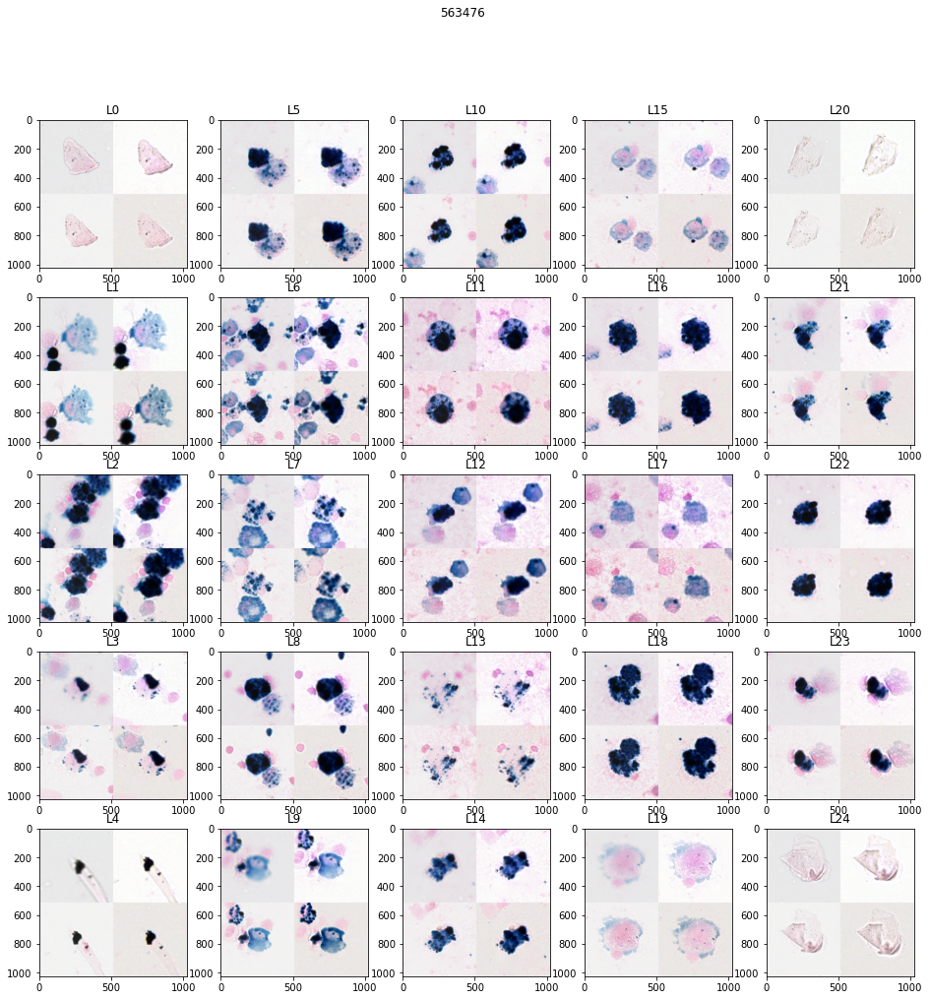

In [71]:
figsize = (16, 16)
patch_size, anno_offset = 512, 64

for image_type in gt_annotations["image_type"].unique():
    
    patient_ids = gt_annotations[gt_annotations["image_type"] == image_type]["patient_id"].unique()
    
    for patient_id in patient_ids:
        

        fig, axes = plt.subplots(ncols=5, nrows=5, figsize=figsize) 
        fig.suptitle(f'{patient_id}')

        type_patch = np.zeros(shape=(patch_size*2, patch_size*2, 3)).astype(np.uint8)
        
        
        for type_name in gt_annotations[gt_annotations["patient_id"] == patient_id]["type_name"].unique():
            
            for idx, scanner in enumerate(gt_annotations["scanner"].unique()):

                df = gt_annotations[(gt_annotations["image_type"] == image_type) & 
                                    (gt_annotations["type_name"] == type_name) & 
                                     (gt_annotations["patient_id"] == patient_id) & 
                                     (gt_annotations["scanner"] == scanner)]

                                
                if df.empty == False:
                    annotation = df.iloc[0]
                    
                    slide = slide_list[annotation.image_name]
                    
                    x_min, y_min = int(annotation.x1 - anno_offset), int(annotation.y1 - anno_offset)
                    x_max, y_max = int(annotation.x2 + anno_offset), int(annotation.y2 + anno_offset)
                    
                    w, h = x_max - x_min, y_max - y_min
                    anno_patch = np.array(slide.read_region(location=(x_min, y_min), level=0, size=(w, h)))[:, :, :3]
                    anno_patch = cv2.resize(anno_patch, (patch_size,patch_size))
                    
                    if idx == 0: type_patch[:patch_size, :patch_size] = anno_patch
                    if idx == 1: type_patch[patch_size:, :patch_size] = anno_patch
                    if idx == 2: type_patch[:patch_size, patch_size:] = anno_patch
                    if idx == 3: type_patch[patch_size:, patch_size:] = anno_patch
            
            ax = axes[coordinates[type_name]]
            ax.imshow(type_patch)
            
            ax.set_title(f"{type_name}")

        plt.show()